### Import Libraries

In [1]:
% matplotlib inline
import skimage
print(skimage.__version__)
import numpy as np
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract, multiply, difference, screen
from PIL.ImageStat import Stat
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage import color, viewer, exposure, img_as_float, data
from skimage.transform import SimilarityTransform, warp, swirl
from skimage.util import invert, random_noise, montage
import matplotlib.image as mpimg
import matplotlib.pylab as plt
from scipy.ndimage import affine_transform, zoom
from scipy import misc
import os
import shutil

0.15.0


/usr/local/lib/python3.6/dist-packages/skimage/viewer/__init__.py:6: UserWarning: Viewer requires Qt
  warn('Viewer requires Qt')


### Reading, Saving and Displaying an image Using PIL

In [2]:
im = Image.open('./Images/parrot.png')
print(im.width, im.height, im.mode, im.format , type(im) )
im.show()

453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>


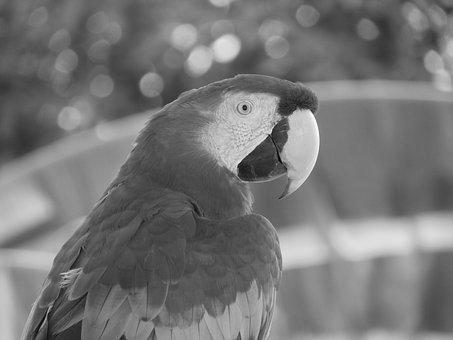

In [3]:
im_g = im.convert('L') #convert the RGB color image to a grayscale image
im_g.save('./Images/Parrot_gray.jpg') #save the image to the disk
Image.open('./Images/Parrot_gray.jpg') # read the grayscale image from the disk and show

### Reading, Saving and Displaying an image Using matplotlib

(960, 1280, 4) float32 <class 'numpy.ndarray'>


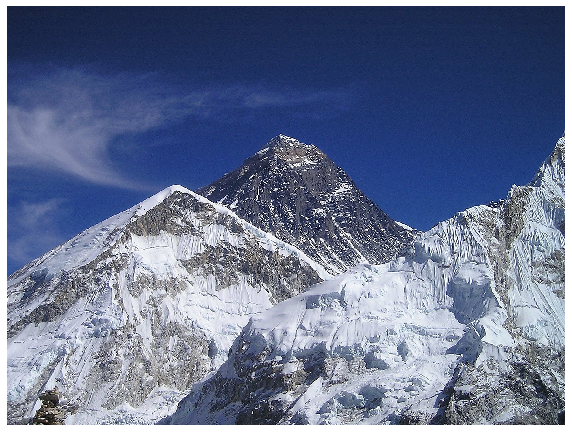

In [4]:
im = mpimg.imread('./Images/hill.png') #read the image from disk as a numpy ndarray
print(im.shape, im.dtype, type(im)) # this image contains an a channel, hence num_channels= 4
plt.figure(figsize=(10, 10))
plt.imshow(im) #display the image
plt.axis('off')
plt.show()

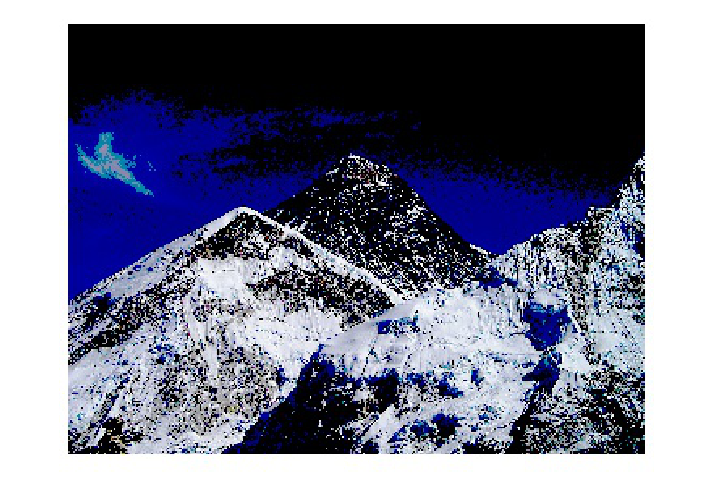

In [5]:
im1 = im
im1[im1 < 0.5]=0 #make the image look darker
plt.imshow(im1)
plt.axis('off')
plt.tight_layout()
plt.savefig('./Images/hill_dark.jpg') #save the dark image
plt.close()
im = mpimg.imread('./Images/hill_dark.jpg') #read the dark image
plt.figure(figsize=(10, 10))
plt.imshow(im)
plt.axis('off') #no axis ticks
plt.tight_layout()
plt.show()

### Interpolating while displaying with matplotlib imshow

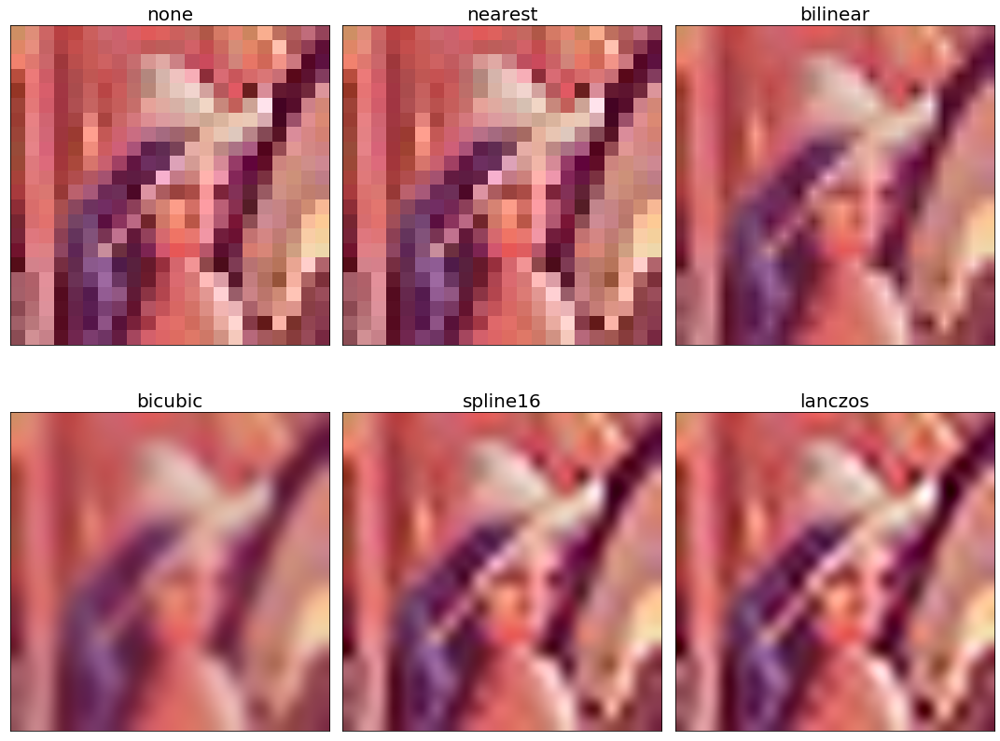

In [6]:
im = mpimg.imread("Images/lena_small.jpg") # read the image from disk as a numpy ndarray
methods = ['none', 
           'nearest', 
           'bilinear', 
           'bicubic', 
           'spline16', 
           'lanczos']

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 12), subplot_kw={'xticks': [], 'yticks': []})
fig.subplots_adjust(hspace=0.05, wspace=0.05)
for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(im, interpolation=interp_method)
    ax.set_title(str(interp_method), size=20)
plt.tight_layout()
plt.show()

### Reading, saving, and displaying an image using scikit-image

(340, 453, 3) uint8 <class 'imageio.core.util.Array'>


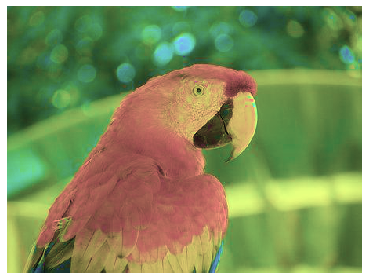

((0.0, 1.0, 0.0, 1.0), <matplotlib.image.AxesImage at 0x7fd018460a90>, None)

In [7]:
im = imread("./Images/parrot.png") # read image from disk, provide the correct path
print(im.shape, im.dtype, type(im))
hsv = color.rgb2hsv(im) # from RGB to HSV color space
hsv[:, :, 1] = 0.5 # change the saturation
im1 = color.hsv2rgb(hsv) # from HSV back to RGB
imsave('./Images/parrot_hsv.png', im1) # save image to disk
im = imread("./Images/parrot_hsv.png")
plt.axis('off'), imshow(im), show()

### Using scikit-image's astronaut dataset

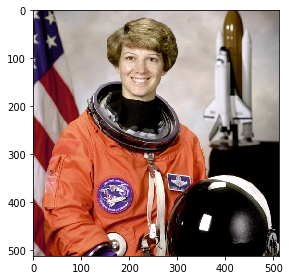

(<matplotlib.image.AxesImage at 0x7fd018427400>, None)

In [8]:
im = data.astronaut()
imshow(im), show()

### Using scipy.misc's face dataset

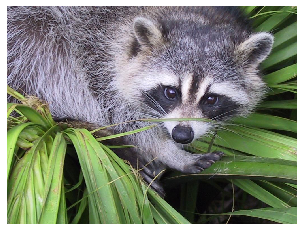

(<matplotlib.image.AxesImage at 0x7fd01838bd68>,
 (-0.5, 1023.5, 767.5, -0.5),
 None)

In [9]:
im = misc.face() # load the raccoon's face image
Image.fromarray(im).save('./Images/face.png')
plt.imshow(im), plt.axis('off'), plt.show()

In [10]:
im = Image.open('./Images/pepper.jpg')
im = np.array(im)
print(type(im), im.shape, im.dtype)

<class 'numpy.ndarray'> (225, 225, 3) uint8


<class 'imageio.core.util.Array'> (225, 225, 3) uint8


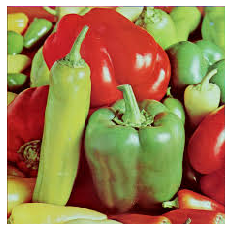

(<matplotlib.image.AxesImage at 0x7fd01834af98>,
 (-0.5, 224.5, 224.5, -0.5),
 None)

In [11]:
import imageio
im = imageio.imread('./Images/pepper.jpg')
print(type(im), im.shape, im.dtype)
plt.imshow(im), plt.axis('off'), plt.show()

### Converting from one file format to another

In [12]:
im = Image.open("./Images/parrot.png")
print(im.mode)
im.save("./Images/parrot.jpg")

RGB


In [13]:
im = Image.open("./Images/hill.png")
print(im.mode)
im.convert('RGB').save("./Images/hill.jpg") # first convert to RGB mode

RGBA


### Converting from one image mode into another

(340, 453, 3)


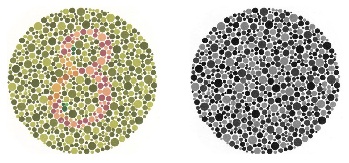

In [14]:
im = imread("./Images/parrot.png", as_gray=False)
print(im.shape)
im = imread("./Images/Ishihara.png")
im_g = color.rgb2gray(im)
plt.subplot(121), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(122), plt.imshow(im_g, cmap='gray'), plt.axis('off')
plt.show()

### Converting from one color space into another

<Figure size 432x288 with 0 Axes>

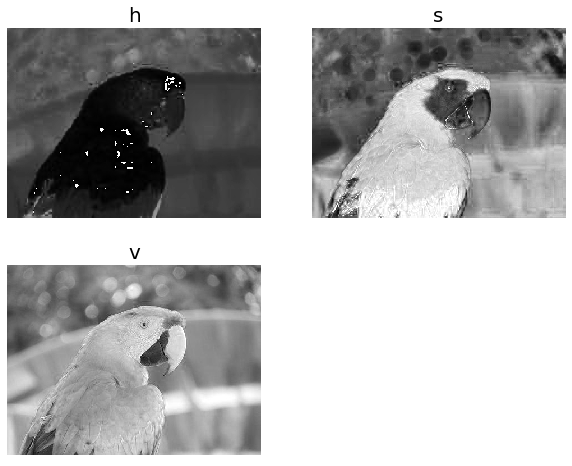

In [15]:
im = imread("./Images/parrot.png")
im_hsv = color.rgb2hsv(im)
plt.gray()
plt.figure(figsize=(10,8))
plt.subplot(221), plt.imshow(im_hsv[...,0]), plt.title('h', size=20),
plt.axis('off')
plt.subplot(222), plt.imshow(im_hsv[...,1]), plt.title('s', size=20),
plt.axis('off')
plt.subplot(223), plt.imshow(im_hsv[...,2]), plt.title('v', size=20),
plt.axis('off')
plt.subplot(224), plt.axis('off')
plt.show()

### Image manipulations with numpy array slicing

[180  76  83]


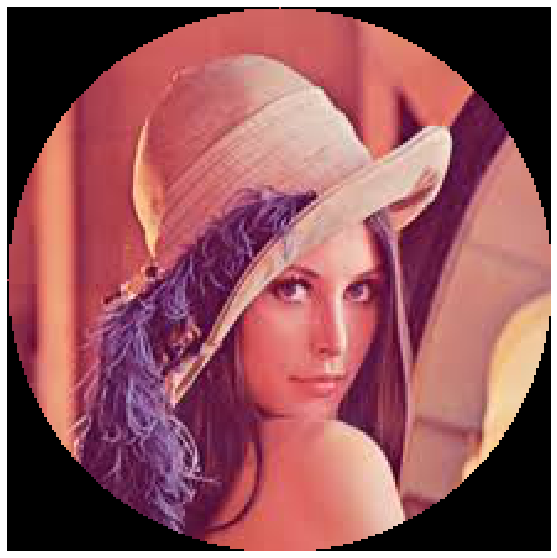

(<matplotlib.image.AxesImage at 0x7fd0182827b8>,
 (-0.5, 219.5, 219.5, -0.5),
 None)

In [16]:
lena = Image.open('./Images/lena.jpg')
lena = np.array(lena)
print(lena[0, 40])
lx, ly, _ = lena.shape
X, Y = np.ogrid[0:lx, 0:ly]
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4
lena[mask,:] = 0
plt.figure(figsize=(10,10))
plt.imshow(lena), plt.axis('off'), plt.show()


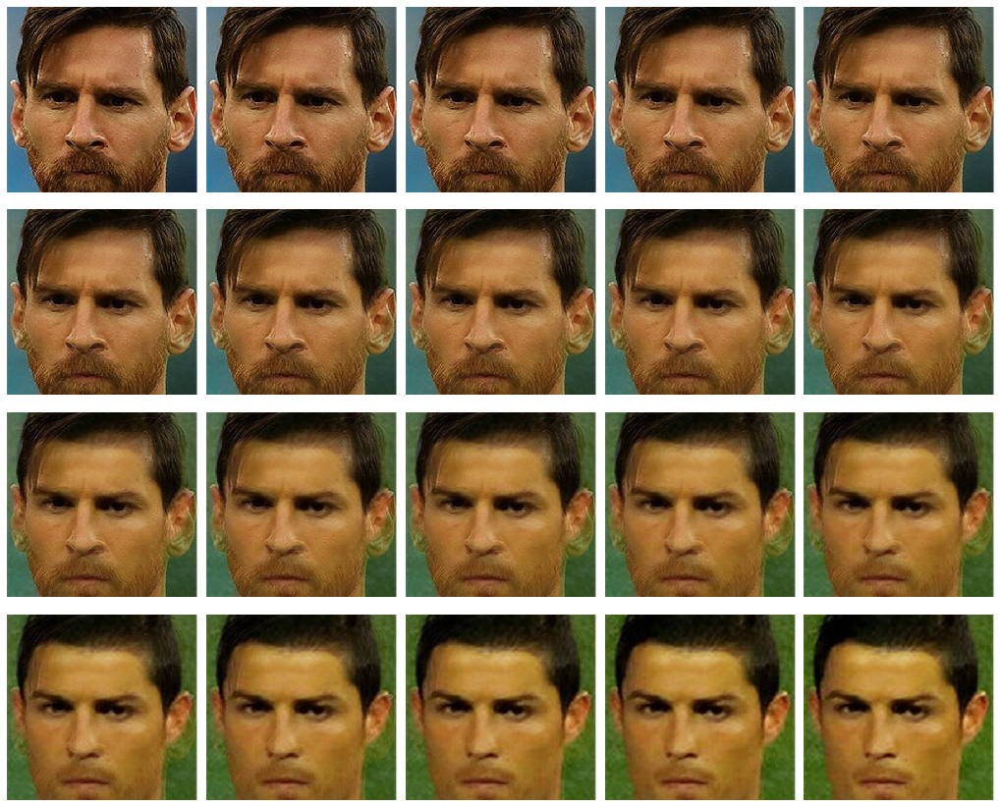

In [17]:
# Images should be in the same dimention

im_messi = mpimg.imread("./Images/messi.jpg") / 255 # scale RGB values in [0,1]
im_ronaldo = mpimg.imread("./Images/ronaldo.jpg") / 255
i = 1
plt.figure(figsize=(18, 15))
for alpha in np.linspace(0,1,20):
  plt.subplot(4,5,i)
  plt.imshow((1-alpha)*im_messi + alpha*im_ronaldo)
  plt.axis('off')
  i+=1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

### Image manipulations with PIL

In [18]:
im = Image.open("./Images/parrot.png") # open the image, provide the correct path
print(im.width, im.height, im.mode, im.format) # print image size, mode and format

453 340 RGB PNG


### Cropping an image

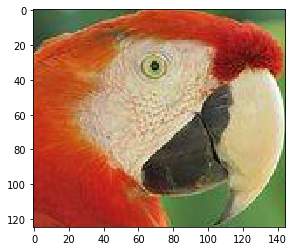

In [19]:
im_c = im.crop((175,75,320,200)) # crop the rectangle given by (left, top, right, bottom) from the image
plt.imshow(im_c)

### Resizing an image

107 105


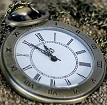

In [20]:
im = Image.open("./Images/clock.jpg")
print(im.width, im.height)
im

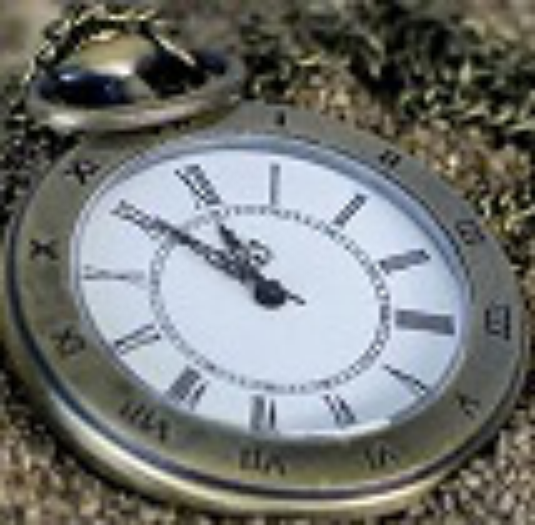

In [21]:
im_large = im.resize((im.width*5, im.height*5), Image.BILINEAR) # bi-linear interpolation
im_large

720 540


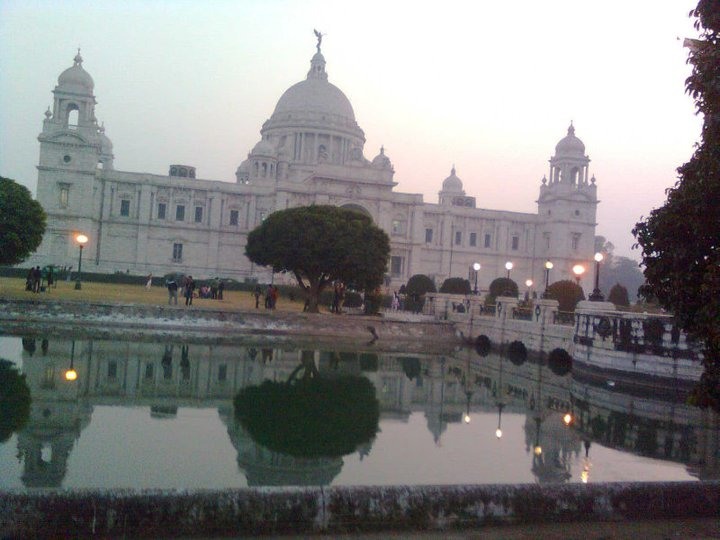

In [22]:
im = Image.open("./Images/victoria_memorial.png")
print(im.width, im.height)
im

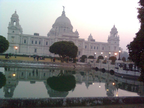

In [23]:
im_small = im.resize((im.width//5, im.height//5), Image.ANTIALIAS)
im_small

### Negating an image

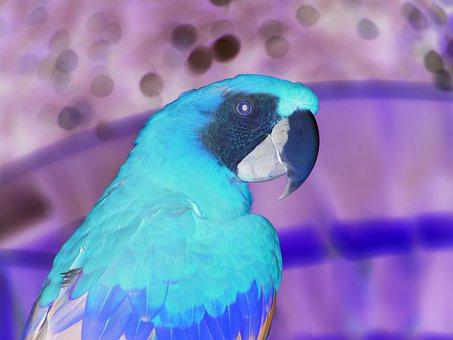

In [24]:
im = Image.open("./Images/parrot.png")
im_t = im.point(lambda x: 255 - x)
im_t

### Converting an image into grayscale

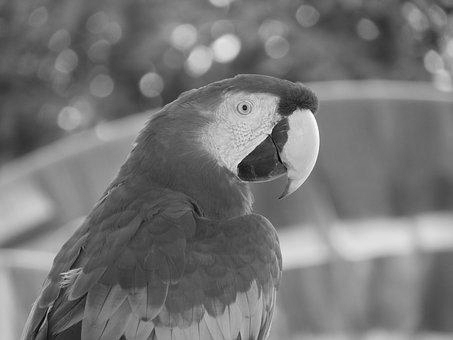

In [25]:
im_g = im.convert('L') # convert the RGB color image to a grayscale image
im_g

### Log transformation

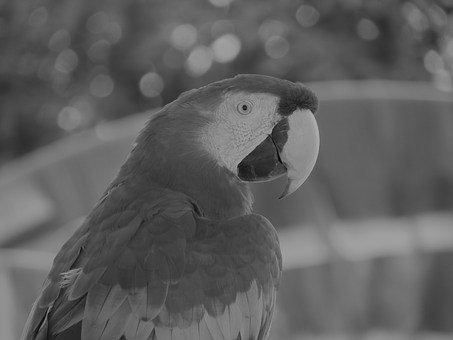

In [26]:
im = im_g.point(lambda x: 255*np.log(1+x/255))
im

### Power-law transformation

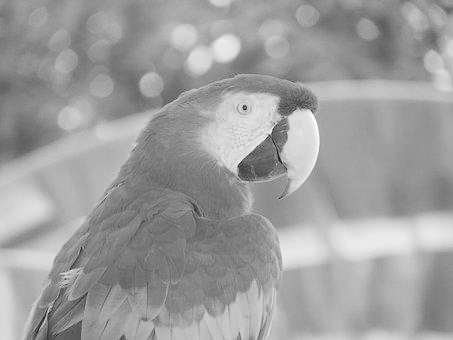

In [27]:
im = im_g.point(lambda x: 255*(x/255)**0.6)
im

### Reflecting an image

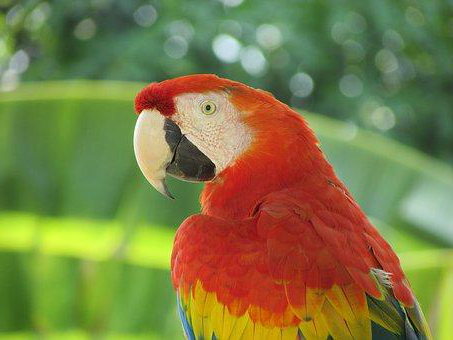

In [28]:
im = Image.open("./Images/parrot.png")
im_result = im.transpose(Image.FLIP_LEFT_RIGHT) # reflect about the vertical axis
im_result

### Rotating an image

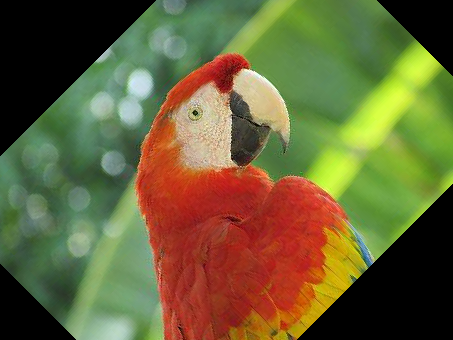

In [29]:
im_rotate_45 = im.rotate(45)
im_rotate_45

### Applying an Affine transformation on an image

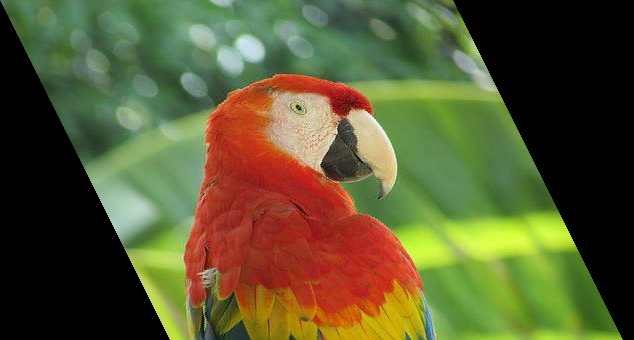

In [30]:
im = Image.open("./Images/parrot.png")
im_trans = im.transform((int(1.4*im.width), im.height), Image.AFFINE, data=(1,-0.5,0,0,1,0)) # shear
im_trans

### Perspective transformation

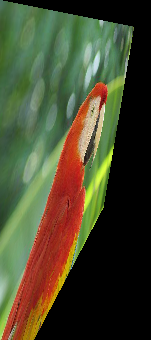

In [31]:
params = [1, 0.1, 0, -0.1, 0.5, 0, -0.005, -0.001]
im_trans = im.transform((im.width//3, im.height), Image.PERSPECTIVE, params, Image.BICUBIC)
im_trans

### Changing pixel values of an image

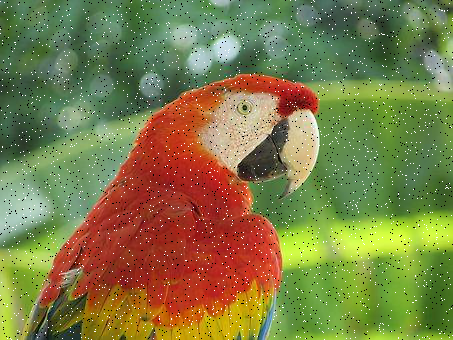

In [32]:
# choose 5000 random locations inside image
im1 = im.copy() # keep the original image, create a copy
n = 5000
x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height,n)
for (x,y) in zip(x,y):
    im1.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # salt-and-pepper noise
im1

### Drawing on an image

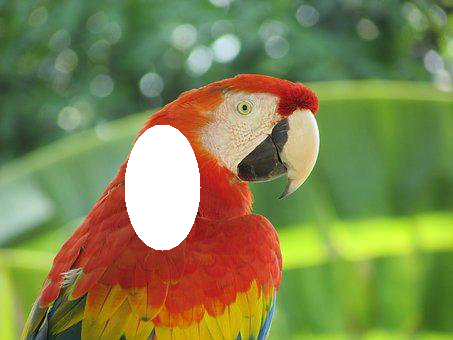

In [33]:
im = Image.open("./Images/parrot.png")
draw = ImageDraw.Draw(im)
draw.ellipse((125, 125, 200, 250), fill=(255,255,255,128))
del draw
im

### Drawing text on an image

In [34]:
!sudo apt-get install ttf-mscorefonts-installer

Reading package lists... Done
Building dependency tree       
Reading state information... Done
ttf-mscorefonts-installer is already the newest version (3.6ubuntu2).
The following packages were automatically installed and are no longer required:
  cuda-cufft-10-1 cuda-cufft-dev-10-1 cuda-curand-10-1 cuda-curand-dev-10-1
  cuda-cusolver-10-1 cuda-cusolver-dev-10-1 cuda-cusparse-10-1
  cuda-cusparse-dev-10-1 cuda-license-10-2 cuda-npp-10-1 cuda-npp-dev-10-1
  cuda-nsight-10-1 cuda-nsight-compute-10-1 cuda-nsight-systems-10-1
  cuda-nvgraph-10-1 cuda-nvgraph-dev-10-1 cuda-nvjpeg-10-1
  cuda-nvjpeg-dev-10-1 cuda-nvrtc-10-1 cuda-nvrtc-dev-10-1 cuda-nvvp-10-1
  libcublas10 libnvidia-common-430 nsight-compute-2019.5.0
  nsight-systems-2019.5.2
Use 'sudo apt autoremove' to remove them.
0 upgraded, 0 newly installed, 0 to remove and 5 not upgraded.


In [0]:
!sudo fc-cache

In [36]:
!fc-match arial

Arial.ttf: "Arial" "Regular"


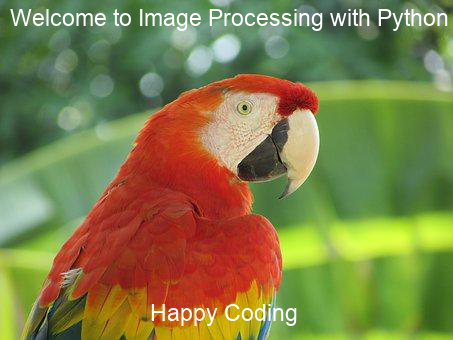

In [37]:
im = Image.open("./Images/parrot.png")
draw = ImageDraw.Draw(im)
font = ImageFont.truetype("arial.ttf", 23) # use a truetype font
draw.text((10, 5), "Welcome to Image Processing with Python", font=font)
draw.text((150,300), "Happy Coding", font=font)
del draw
im

### Creating a thumbnail

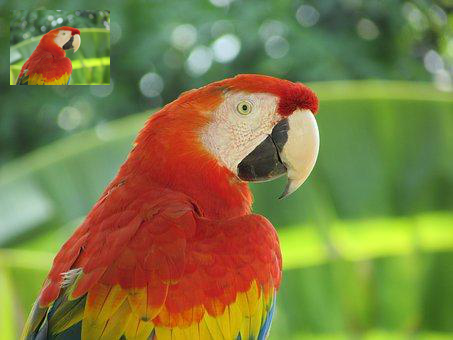

In [38]:
im = Image.open("./Images/parrot.png")
im_thumbnail = im.copy() # need to copy the original image first
im_thumbnail.thumbnail((100,100)) # now paste the thumbnail on the image
im.paste(im_thumbnail, (10,10))
im.save("./Images/parrot_thumb.jpg")
im

### Computing the basic statistics of an image

In [39]:
s = Stat(im)
print(s.extrema) # maximum and minimum pixel values for each channel R, G, B
print(s.count)
print(s.mean)
print(s.median)
print(s.stddev)

[(0, 255), (0, 255), (0, 253)]
[154020, 154020, 154020]
[127.6216919880535, 124.87110115569406, 67.89499415660303]
[121, 130, 62]
[47.68779592915661, 52.249097463622974, 39.91251964471368]


### Plotting the histograms of pixel values for the RGB channels of an image

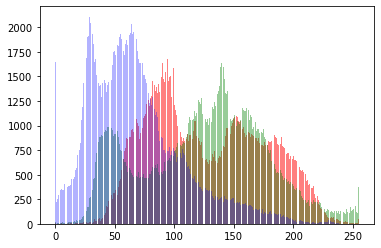

In [40]:
pl = im.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.5)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3)
plt.show()

### Separating the RGB channels of an image

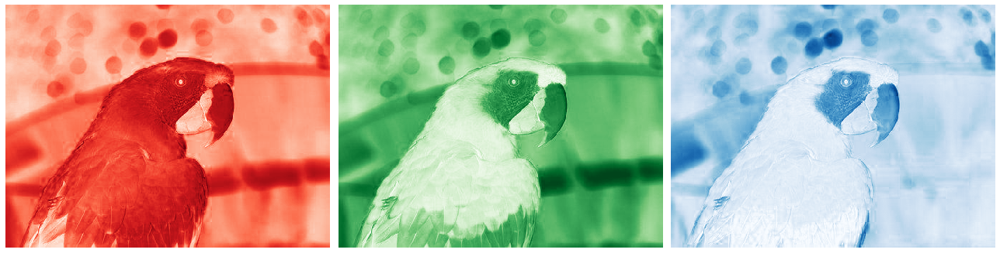

In [41]:
im = Image.open("./Images/parrot.png")
ch_r, ch_g, ch_b = im.split() # split the RGB image into 3 channels: R, G and B
# we shall use matplotlib to display the channels
plt.figure(figsize=(18,6))
plt.subplot(1,3,1); plt.imshow(ch_r, cmap=plt.cm.Reds); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(ch_g, cmap=plt.cm.Greens); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(ch_b, cmap=plt.cm.Blues); plt.axis('off')
plt.tight_layout()
plt.show() # show the R, G, B channels

### Combining multiple channels of an image

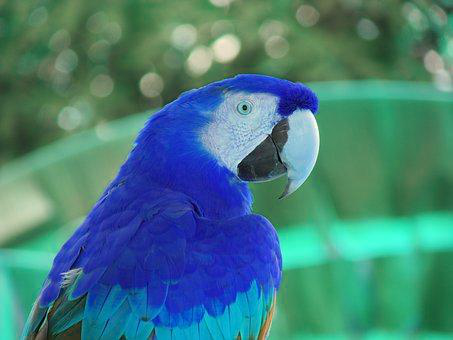

In [42]:
im = Image.merge('RGB', (ch_b, ch_g, ch_r)) # swap the red and blue channels obtained last time with split()
im

### α-blending two images

In [0]:
im1 = Image.open("./Images/parrot.png")
im2 = Image.open("./Images/hill.png")
im1 = im1.convert('RGBA') # two images have different modes, must be converted to the same mode
im2 = im2.resize((im1.width, im1.height), Image.BILINEAR) # two images have different sizes, must be converted to the same size
im = Image.blend(im1, im2, alpha=0.5)

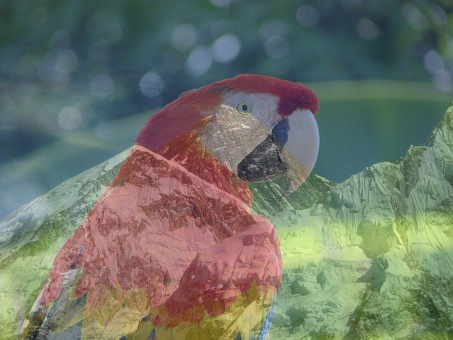

In [44]:
im

### Superimposing two images

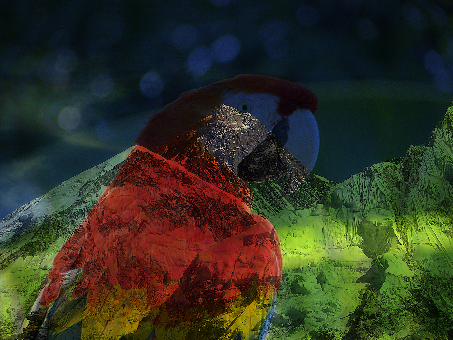

In [45]:
im1 = Image.open("./Images/parrot.png")
im2 = Image.open("./Images/hill.png").convert('RGB').resize((im1.width, im1.height))
im = multiply(im1, im2)
im

### Adding two images

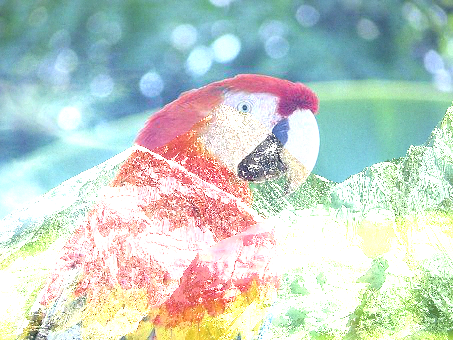

In [46]:
im = add(im1, im2)
im

### Computing the difference between two images

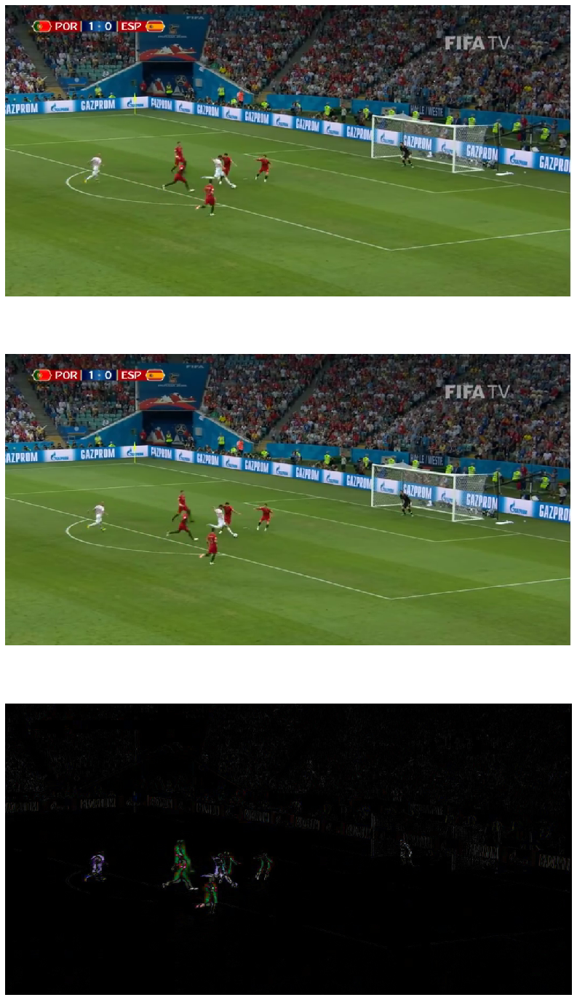

In [47]:
im1 = Image.open("./Images/goal1.png") # load two consecutive frame images from the video
im2 = Image.open("./Images/goal2.png")
im = difference(im1, im2)
plt.figure(figsize=(20,25))
im.save("./Images/goal_diff.png")
plt.subplot(311)
plt.imshow(im1)
plt.axis('off')
plt.subplot(312)
plt.imshow(im2)
plt.axis('off')
plt.subplot(313)
plt.imshow(im), plt.axis('off')
plt.show()


### Inverse warping and geometric transformation using the warp() function

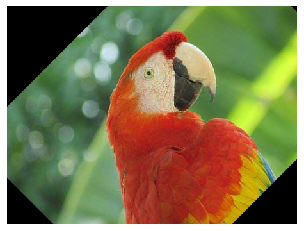

(<matplotlib.image.AxesImage at 0x7fd0175266a0>,
 (-0.5, 452.5, 339.5, -0.5),
 None)

In [48]:
im = imread("./Images/parrot.png")
tform = SimilarityTransform(scale=0.9,
rotation=np.pi/4,translation=(im.shape[0]/2, -100))
warped = warp(im, tform)
plt.imshow(warped), plt.axis('off'), plt.show()

### Applying the swirl transform

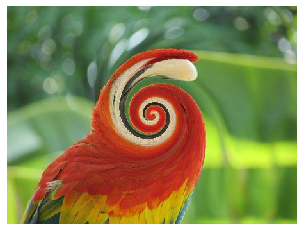

In [49]:
im = imread("./Images/parrot.png")
swirled = swirl(im, rotation=0, strength=15, radius=200)
plt.imshow(swirled)
plt.axis('off')
plt.show()

### Adding random Gaussian noise to images

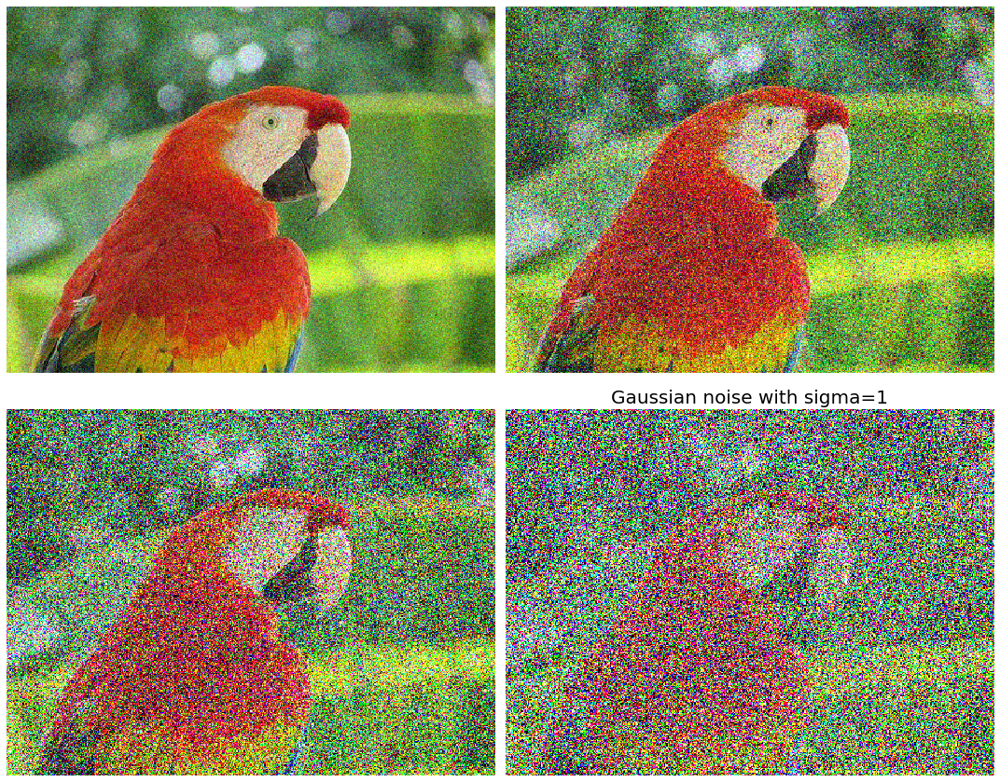

In [50]:
im = img_as_float(imread("./Images/parrot.png"))
plt.figure(figsize=(15,12))
sigmas = [0.1, 0.25, 0.5, 1]
for i in range(4):
    noisy = random_noise(im, var=sigmas[i]**2)
    plt.subplot(2,2,i+1)
    plt.imshow(noisy)
    plt.axis('off')
plt.title('Gaussian noise with sigma=' + str(sigmas[i]), size=20)
plt.tight_layout()
plt.show()

### Drawing contour lines for an image

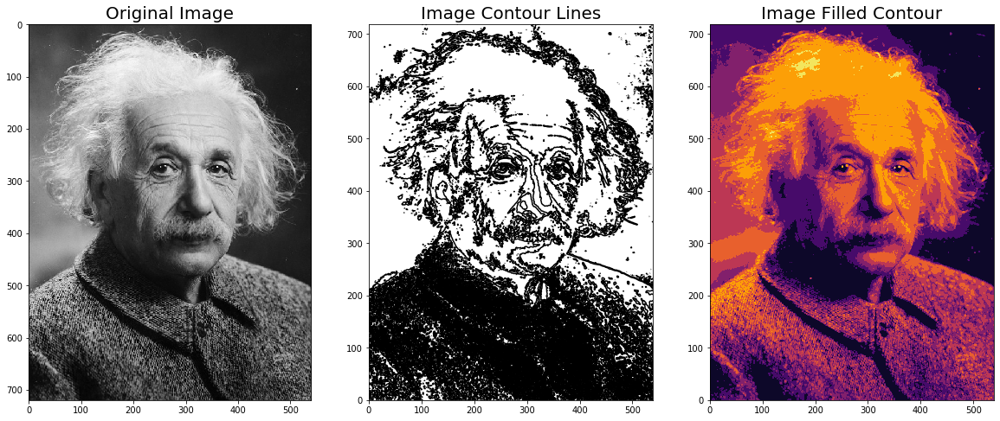

In [51]:
im = color.rgb2gray(imread("./Images/einstein.jpg")) # read the image from disk as a numpy ndarray
plt.figure(figsize=(20,8))
plt.subplot(131), plt.imshow(im, cmap='gray'), plt.title('Original Image', size=20)
plt.subplot(132), plt.contour(np.flipud(im), colors='k',
levels=np.logspace(-15, 15, 100))
plt.title('Image Contour Lines', size=20)
plt.subplot(133), plt.title('Image Filled Contour', size=20),
plt.contourf(np.flipud(im), cmap='inferno')
plt.show()